In [26]:
import numpy as np
import pandas as pd
import os
seed=42
np.random.seed(seed)
import os
dir_path='C:\\Data Science\\kaggle regr competion'
file_name='preprocessedtrain.csv'
dataset=pd.read_csv(os.path.join(dir_path,file_name))

In [27]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1328 entries, 0 to 1327
Columns: 220 entries, MSSubClass to PavedDrive_Y
dtypes: float64(4), int64(216)
memory usage: 2.2 MB


In [28]:
dataset.head(10)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y
0,60,65.0,8450,7,5,196.0,706,0,150,856,...,0,0,0,1,0,0,0,1,0,1
1,20,80.0,9600,6,8,0.0,978,0,284,1262,...,0,0,0,1,0,0,0,1,0,1
2,60,68.0,11250,7,5,162.0,486,0,434,920,...,0,0,0,1,0,0,0,1,0,1
3,70,60.0,9550,7,5,0.0,216,0,540,756,...,0,0,0,1,0,0,0,1,0,1
4,60,84.0,14260,8,5,350.0,655,0,490,1145,...,0,0,0,1,0,0,0,1,0,1
5,50,85.0,14115,5,5,0.0,732,0,64,796,...,0,0,0,1,0,0,0,1,0,1
6,20,75.0,10084,8,5,186.0,1369,0,317,1686,...,0,0,0,1,0,0,0,1,0,1
7,50,51.0,6120,7,5,0.0,0,0,952,952,...,1,0,0,0,0,0,0,1,0,1
8,190,50.0,7420,5,6,0.0,851,0,140,991,...,0,1,0,0,0,0,0,1,0,1
9,20,70.0,11200,5,5,0.0,906,0,134,1040,...,0,0,0,1,0,0,0,1,0,1


In [29]:
target_name='SalePrice'
dep_var=dataset.columns.tolist()
dep_var.remove(target_name)

In [30]:
num_col=list(dataset[dep_var].select_dtypes(include=['integer','float'],exclude=['object']).columns)

In [31]:
num_dep__var=['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal']
 


In [32]:
cat_encod_dep__var=['MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_NoSeWa',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Mod',
 'LandSlope_Sev',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_SWISU',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker',
 'Condition1_Feedr',
 'Condition1_Norm',
 'Condition1_PosA',
 'Condition1_PosN',
 'Condition1_RRAe',
 'Condition1_RRAn',
 'Condition1_RRNe',
 'Condition1_RRNn',
 'Condition2_Feedr',
 'Condition2_Norm',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'BldgType_2fmCon',
 'BldgType_Duplex',
 'BldgType_Twnhs',
 'BldgType_TwnhsE',
 'HouseStyle_1.5Unf',
 'HouseStyle_1Story',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'HouseStyle_2Story',
 'HouseStyle_SFoyer',
 'HouseStyle_SLvl',
 'RoofStyle_Gable',
 'RoofStyle_Gambrel',
 'RoofStyle_Hip',
 'RoofStyle_Mansard',
 'RoofStyle_Shed',
 'RoofMatl_Membran',
 'RoofMatl_Metal',
 'RoofMatl_Roll',
 'RoofMatl_Tar&Grv',
 'RoofMatl_WdShake',
 'RoofMatl_WdShngl',
 'Exterior1st_AsphShn',
 'Exterior1st_BrkComm',
 'Exterior1st_BrkFace',
 'Exterior1st_CBlock',
 'Exterior1st_CemntBd',
 'Exterior1st_HdBoard',
 'Exterior1st_ImStucc',
 'Exterior1st_MetalSd',
 'Exterior1st_Plywood',
 'Exterior1st_Stone',
 'Exterior1st_Stucco',
 'Exterior1st_VinylSd',
 'Exterior1st_Wd Sdng',
 'Exterior1st_WdShing',
 'Exterior2nd_AsphShn',
 'Exterior2nd_Brk Cmn',
 'Exterior2nd_BrkFace',
 'Exterior2nd_CBlock',
 'Exterior2nd_CmentBd',
 'Exterior2nd_HdBoard',
 'Exterior2nd_ImStucc',
 'Exterior2nd_MetalSd',
 'Exterior2nd_Other',
 'Exterior2nd_Plywood',
 'Exterior2nd_Stone',
 'Exterior2nd_Stucco',
 'Exterior2nd_VinylSd',
 'Exterior2nd_Wd Sdng',
 'Exterior2nd_Wd Shng',
 'MasVnrType_BrkFace',
 'MasVnrType_None',
 'MasVnrType_Stone',
 'ExterQual_Fa',
 'ExterQual_Gd',
 'ExterQual_TA',
 'ExterCond_Fa',
 'ExterCond_Gd',
 'ExterCond_Po',
 'ExterCond_TA',
 'Foundation_CBlock',
 'Foundation_PConc',
 'Foundation_Slab',
 'Foundation_Stone',
 'Foundation_Wood',
 'BsmtQual_Fa',
 'BsmtQual_Gd',
 'BsmtQual_TA',
 'BsmtCond_Gd',
 'BsmtCond_Po',
 'BsmtCond_TA',
 'BsmtExposure_Gd',
 'BsmtExposure_Mn',
 'BsmtExposure_No',
 'BsmtFinType1_BLQ',
 'BsmtFinType1_GLQ',
 'BsmtFinType1_LwQ',
 'BsmtFinType1_Rec',
 'BsmtFinType1_Unf',
 'BsmtFinType2_BLQ',
 'BsmtFinType2_GLQ',
 'BsmtFinType2_LwQ',
 'BsmtFinType2_Rec',
 'BsmtFinType2_Unf',
 'Heating_GasA',
 'Heating_GasW',
 'Heating_Grav',
 'Heating_OthW',
 'Heating_Wall',
 'HeatingQC_Fa',
 'HeatingQC_Gd',
 'HeatingQC_Po',
 'HeatingQC_TA',
 'CentralAir_Y',
 'Electrical_FuseF',
 'Electrical_FuseP',
 'Electrical_Mix',
 'Electrical_SBrkr',
 'KitchenQual_Fa',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'Functional_Maj2',
 'Functional_Min1',
 'Functional_Min2',
 'Functional_Mod',
 'Functional_Typ',
 'FireplaceQu_Fa',
 'FireplaceQu_Gd',
 'FireplaceQu_Po',
 'FireplaceQu_TA',
 'FireplaceQu_no_fireplace',
 'GarageType_Attchd',
 'GarageType_Basment',
 'GarageType_BuiltIn',
 'GarageType_CarPort',
 'GarageType_Detchd',
 'GarageFinish_RFn',
 'GarageFinish_Unf',
 'GarageQual_Fa',
 'GarageQual_Gd',
 'GarageQual_Po',
 'GarageQual_TA',
 'GarageCond_Fa',
 'GarageCond_Gd',
 'GarageCond_Po',
 'GarageCond_TA',
 'PavedDrive_P',
 'PavedDrive_Y']

In [33]:
def df_chunker(df,n):
    l=list(df.columns)
    chunked_df=[l[i:i + n] for i in range(0, len(l), n)]
    return chunked_df

In [34]:
X_cat_enc=dataset[cat_encod_dep__var]

In [ ]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.8 * (1 - .8)))
X_cat_enc=sel.fit_transform(X_cat_enc)

In [35]:
y=dataset[target_name]

In [36]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

dt_regr=DecisionTreeRegressor()

n_features=X_cat_enc.shape[1]
half_features=int(round(0.5*n_features))
sqrt_n = int(round(n_features**0.5))
from math import log
log_n=int(round(log(n_features,2)))
lower_features=int(round(n_features*0.3))
upper_features=int(round(n_features*0.4))

criterions=['mae','mse','friedman_mse']
splitter=['best','random']
samples_percent1=np.logspace(-4, 0, num=10,endpoint=True,base=10.0)
bool_lst=[False,True]

params1= {'criterion':criterions,
          'splitter':splitter,
          'min_samples_split':samples_percent1,
          'presort':bool_lst}
          
         

dt_regr_gs1=GridSearchCV(estimator=dt_regr,
                        cv=2,
                        param_grid=params1,
                        scoring='r2',
                        verbose=4,
                        n_jobs=1)


dt_regr_gs1.fit(X_cat_enc,y)

# summarize the results of the random parameter search
print(dt_regr_gs1.best_score_)
print(dt_regr_gs1.best_estimator_)

dt_regr1=dt_regr_gs1.best_estimator_

Fitting 2 folds for each of 120 candidates, totalling 240 fits
[CV] criterion=mae, min_samples_split=0.0001, presort=False, splitter=best 
[CV]  criterion=mae, min_samples_split=0.0001, presort=False, splitter=best, score=0.5109542521857257, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=False, splitter=best 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV]  criterion=mae, min_samples_split=0.0001, presort=False, splitter=best, score=0.44441022817623266, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=False, splitter=random 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s


[CV]  criterion=mae, min_samples_split=0.0001, presort=False, splitter=random, score=0.512859557814499, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=False, splitter=random 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s remaining:    0.0s


[CV]  criterion=mae, min_samples_split=0.0001, presort=False, splitter=random, score=0.461566667273959, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=True, splitter=best 
[CV]  criterion=mae, min_samples_split=0.0001, presort=True, splitter=best, score=0.5055345944710958, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=True, splitter=best 
[CV]  criterion=mae, min_samples_split=0.0001, presort=True, splitter=best, score=0.47376345602453596, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=True, splitter=random 
[CV]  criterion=mae, min_samples_split=0.0001, presort=True, splitter=random, score=0.5226340290079616, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0001, presort=True, splitter=random 
[CV]  criterion=mae, min_samples_split=0.0001, presort=True, splitter=random, score=0.46775834634839353, total=   0.2s
[CV] criterion=mae, min_samples_split=0.0002782559402207126, presort=False, splitter=best 
[CV]  criterion=m

[CV]  criterion=mae, min_samples_split=0.016681005372000592, presort=False, splitter=best, score=0.5744102475513324, total=   0.1s
[CV] criterion=mae, min_samples_split=0.016681005372000592, presort=False, splitter=random 
[CV]  criterion=mae, min_samples_split=0.016681005372000592, presort=False, splitter=random, score=0.5702841135214545, total=   0.1s
[CV] criterion=mae, min_samples_split=0.016681005372000592, presort=False, splitter=random 
[CV]  criterion=mae, min_samples_split=0.016681005372000592, presort=False, splitter=random, score=0.5736525887902657, total=   0.1s
[CV] criterion=mae, min_samples_split=0.016681005372000592, presort=True, splitter=best 
[CV]  criterion=mae, min_samples_split=0.016681005372000592, presort=True, splitter=best, score=0.5869571135425451, total=   0.1s
[CV] criterion=mae, min_samples_split=0.016681005372000592, presort=True, splitter=best 
[CV]  criterion=mae, min_samples_split=0.016681005372000592, presort=True, splitter=best, score=0.5764297941142

[CV]  criterion=mse, min_samples_split=0.0001, presort=True, splitter=best, score=0.5481159451389286, total=   0.0s
[CV] criterion=mse, min_samples_split=0.0001, presort=True, splitter=best 
[CV]  criterion=mse, min_samples_split=0.0001, presort=True, splitter=best, score=0.43316076165500805, total=   0.0s
[CV] criterion=mse, min_samples_split=0.0001, presort=True, splitter=random 
[CV]  criterion=mse, min_samples_split=0.0001, presort=True, splitter=random, score=0.5468144503582932, total=   0.0s
[CV] criterion=mse, min_samples_split=0.0001, presort=True, splitter=random 
[CV]  criterion=mse, min_samples_split=0.0001, presort=True, splitter=random, score=0.48821380697094774, total=   0.0s
[CV] criterion=mse, min_samples_split=0.0002782559402207126, presort=False, splitter=best 
[CV]  criterion=mse, min_samples_split=0.0002782559402207126, presort=False, splitter=best, score=0.5346215766815248, total=   0.0s
[CV] criterion=mse, min_samples_split=0.0002782559402207126, presort=False, sp

[CV]  criterion=mse, min_samples_split=0.016681005372000592, presort=True, splitter=best, score=0.5864945669735411, total=   0.0s
[CV] criterion=mse, min_samples_split=0.016681005372000592, presort=True, splitter=random 
[CV]  criterion=mse, min_samples_split=0.016681005372000592, presort=True, splitter=random, score=0.5700920256301807, total=   0.0s
[CV] criterion=mse, min_samples_split=0.016681005372000592, presort=True, splitter=random 
[CV]  criterion=mse, min_samples_split=0.016681005372000592, presort=True, splitter=random, score=0.5720549009793192, total=   0.0s
[CV] criterion=mse, min_samples_split=0.046415888336127774, presort=False, splitter=best 
[CV]  criterion=mse, min_samples_split=0.046415888336127774, presort=False, splitter=best, score=0.5811770496522723, total=   0.0s
[CV] criterion=mse, min_samples_split=0.046415888336127774, presort=False, splitter=best 
[CV]  criterion=mse, min_samples_split=0.046415888336127774, presort=False, splitter=best, score=0.61429092221932

[CV]  criterion=friedman_mse, min_samples_split=0.0001, presort=True, splitter=random, score=0.5369998771157523, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.0001, presort=True, splitter=random 
[CV]  criterion=friedman_mse, min_samples_split=0.0001, presort=True, splitter=random, score=0.4461728853257576, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.0002782559402207126, presort=False, splitter=best 
[CV]  criterion=friedman_mse, min_samples_split=0.0002782559402207126, presort=False, splitter=best, score=0.5340131630926799, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.0002782559402207126, presort=False, splitter=best 
[CV]  criterion=friedman_mse, min_samples_split=0.0002782559402207126, presort=False, splitter=best, score=0.4701651963631718, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.0002782559402207126, presort=False, splitter=random 
[CV]  criterion=friedman_mse, min_samples_split=0.0002782559402207126, preso

[CV] criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=False, splitter=random 
[CV]  criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=False, splitter=random, score=0.5737304546452258, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=True, splitter=best 
[CV]  criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=True, splitter=best, score=0.6112627000094177, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=True, splitter=best 
[CV]  criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=True, splitter=best, score=0.5707020086796404, total=   0.0s
[CV] criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=True, splitter=random 
[CV]  criterion=friedman_mse, min_samples_split=0.016681005372000592, presort=True, splitter=random, score=0.5993150605947846, total=   0.0s
[CV] criterion=friedman_mse, min_samples_s

0.6045678740188937
DecisionTreeRegressor(criterion='friedman_mse', max_depth=None,
           max_features=None, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=0.046415888336127774,
           min_weight_fraction_leaf=0.0, presort=False, random_state=None,
           splitter='random')


[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:   23.1s finished


In [41]:
dt_regr1=dt_regr_gs1.best_estimator_

In [42]:
depth=np.arange(2,16)
impurity=np.linspace(0.1, 0.5,20,endpoint=True)
max_features=list([log_n,sqrt_n,lower_features,upper_features,half_features,n_features])
min_weight_fraction_leaf=np.linspace(0.0,0.5,15,endpoint=True)

params2={'max_depth':depth,
         'min_impurity_decrease':impurity,
         'max_features':max_features,
         'min_weight_fraction_leaf':min_weight_fraction_leaf}
         
dt_regr_gs2=GridSearchCV(estimator=dt_regr,
                        cv=2,
                        param_grid=params2,
                        scoring='r2',
                        verbose=4,
                        n_jobs=1)

dt_regr_gs2.fit(X_cat_enc,y)
# summarize the results of the random parameter search
print(dt_regr_gs2.best_score_)
print(dt_regr_gs2.best_estimator_)

dt_regr1=dt_regr_gs2.best_estimator_

Fitting 2 folds for each of 25200 candidates, totalling 50400 fits
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.3109878467702003, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.1397062179253874, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.05681273531927977, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.11445678

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s



[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.21696847137978859, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] 

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.10252360201503452, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, tota

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=-0.0112

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.28936

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.37957590306454325, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.30510761063270175, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.20526315789473684, min_w

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.4144369726983673, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.29927037986442406, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.24723764345995614, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.21391

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.2368865002897197, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.19222072660441214, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.10252360201503452, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.11798

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.19365059291030062, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.05069228180849916, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.18237156442650304, total=   0.0s
[

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.31931614740382186, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=-0.0078098173174432

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=-

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.0112

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, 

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.10436543687038469, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.14672622344817787, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.33360366537354813, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.1714031783063743, total=   0.0s
[CV] max_depth=2, ma

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.33964959568037456, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.2826344200856302, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.17074001795557936, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.120672170156

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.3424208428132588, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.17153498258059974, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.27794385410084166, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.187542898523

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.0026610387008707548, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, 

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.27445849213262097, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.00780981731

[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=2, max_features=8, min_impurity_decrease=0.5, min_weight_fra

[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.3902419492540935, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decreas

[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.12775758873413212, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.3430816472608794, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.39467356538208587, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=14, min_impuri

[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.3980006389251317, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.18285909425356128, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.3074376813502473, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.29907547881116303, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.3331092783692732, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.3676499432634244, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.31247798841674246, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.3695045178351335, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, scor

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.19915011106886404, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.34869692055259915, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.3341573451297213, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.06859187328497485, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.1823827336423648, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.30839466035092067, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.2

[CV] max_depth=2, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.37368421052631584, min_wei

[CV] max_depth=2, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.4480842443347619, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.36796212296019015, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.22731637530819782, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105,

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.31078559427770414, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.43

[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.41016198265120396, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.2

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.383894649638057, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.23139097438000844, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, m

[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.34961657880583596, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.37428198731612605, total=   0.0s
[CV] max_depth=2, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features

[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.3478955042868995, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.36499059167054604, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.37764803908937417, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.4046308911989098, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.4277197829125352, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.45685341995749695, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.455332

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.4373092028585154, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.461628907275778, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.47034789854357806, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4429003

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, t

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2962958157565613, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2852270514556835, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.1221383

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.3458549849719167, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.40266216314131786, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.26842105263157

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.43647307187016304, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.44338825140958193, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.40028724271003824, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.3980

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.3867388760645907, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.461628907275778, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.4053822989980701, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.3

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.2752066192961862, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.2733136708402555, total=   

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.1694761778330205, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.12257228725898

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=-0

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s


[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=

[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.4889163183557548, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.43636522830338276, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.4789473684210527, 

[CV] max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.4404171524878643, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.435564162407168, total=   0.0s
[CV] max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.4232496820392838, total=   0.0s
[CV] max_depth=2, max_features=55, min

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.3018996131763648, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.32142857142

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.28936

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.27445849213262097, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.311

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.27445

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.10579030365438624, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.22544

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.33270525091600855, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.4239741064467404, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.4177292038669619, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0

[CV] max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.44534378420181964, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.3962008845707189, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4311670881353117, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  ma

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.37909556808072353, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.4556128491227349, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.4404171524878643, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.43233952968081935, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.36650384621154153, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.3235236687999161, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.37502

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.289362

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.01128

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.4046308911989098, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.3947368421052631

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.4183412303750933, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.4006747648687834, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.4989884783712496, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.4551684869298417, total=   0.0s
[CV] max_depth=2, max_f

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.44201514963897504, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.44993052558712887, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.4566712694017414, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.43204

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.446090363218813, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.461628907275778, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.38

[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.29304296144253295, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.22544909903419008, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.37764803908937417, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.47894736842105

[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf

[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.31126

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.4239535813899057, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.4418927705962201, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.434399457

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.43964357419355526, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.43564166516958336, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3627926963403224, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.4076159699771631, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.4498364913102887, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.4416193648915363, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4668441235227203, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.39781727417128976, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.43543682344965895, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.4046308911989098, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.4204735945961898, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.4417479943182402, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.4262263864201805, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.42143204994835515, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.34693660400549087, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.359987434275026, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.41412520295245825, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.3977750365222177, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.37246469248894876, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.40827

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.38568465621707304, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.36499059167054604, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.37246

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.359987434275026, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.38568465621707304, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.2908263071613185, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0

[CV] max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.37502717746157166, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.30241196753294375, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.37246469248894876, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0s
[CV

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.35509847341091183, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.36499059167054604, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.34347102597421775, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[C

[CV] max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.38488069908039746, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_dec

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.37764803908937417, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.27794385410084166, total=   0.0s
[CV] max_depth=2, max_features=92,

[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.2863486376825377, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=2, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.32142857142

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decreas

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.4665658223470127, total=   0.0s
[CV] max_de

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.46

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.5

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, sco

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, sc

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, sc

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, sco

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.4

[CV] max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.502809791438098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.4665658223470127, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.4566712694017414, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.4566712694017414, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.4415443327557098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4566712694017414, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4415443327557098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4566712694017414, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4415443327557098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, s

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.4415443327557098, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, s

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, tot

[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=2, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.18271289469756136, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.07030280297033309, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.12257228725898128, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.005969975656149762, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_l

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.3193674352992235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.3633005239905971, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.1694761778330205, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.0393168867186241, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=-0.0112836

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=-0.0078098

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[C

[CV] max_depth=3, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.3082870707828842, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.406901

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.14499342382623925, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.27396485513537716, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.322366071278805, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.365748

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.14946295781795205, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.1801985141362189, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.138

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.041876558389171814, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.24032224715543937, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.2863486376825377, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=-0.0194503279401137, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.016031218271625236, tota

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.12213837626647162, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.1694761778330205, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=-0.0078098173174432

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.0112836

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.21447133974786148, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.42377346959460827, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.15946806886938547, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.2907828077055957, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.21013508245232126, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.3310021079600518, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.1872429242991

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.10805654259823227, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.30116078483087994, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.0026610387008707548, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.22

[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.0656806542388727, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.478

[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.2768879492714882, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.28941264845420656, total=   0.0s
[CV] max_depth=3, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.25571756587151906, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.3665269987519245, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.3646675854356247, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.3920885910152545, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.27114466290638095, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.2768879492714882, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.276

[CV] max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.22490223090392358, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.4358901295985086, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.29320035291580715, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.3708319530386094, total=   0.0s
[CV] max_depth

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.33527088383643444, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.23858855622975184, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.3546761137079869, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=

[CV] max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.16517512842245008, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=14, min_impurity_decrease

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.09664249994663121, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_featu

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.30988923706506, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.4236047891839039, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.33125087015382937, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.3513527384766034,

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.3065562837458967, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.3210307619939491, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.3661902376709757, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.3064907979235407, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.26268352670713735, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.22544909903419008, total=   0.0s
[C

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.12257228725898128, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.09664249994663121, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, total= 

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score

[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.46768495009830513, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.2817601015397079, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.31455038136225477, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.42296932031747025, total=   0.0s
[CV] max_depth=3, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.3973042891504589, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4786310503991027, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.3507240964406029, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4748212653134859, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1, min_weight_fractio

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.4052024812150984, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.3152769187895067, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.34462528798603786, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.38488069908039746, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.32394851434030036, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.27794385410084166, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.26386

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5564811538000781, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.4520304141354281, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.20526315789473684,

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.4815557810698705, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.4392165415456786, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.5053941734398433, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.34558098227089673, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.278038065743783, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.33609285843249204, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.3022656599383444, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, 

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.0656806542388727, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total= 

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5171320278754881, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5418987624488267, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.47104318726050975, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_dec

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.4588584979610323, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4718465853658341, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4393668096555303, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.31849999059897294, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.2733136708402555, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.19964136812366362, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_featu

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.2863486376825

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.127484528848971, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5148516290740714, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.4

[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.3542789455999169, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.5432394875076483, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.5101227382392899, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.45264330096964644, total=   0.0s
[CV] max_depth=3, max_features=55, min_impurity_decrease=0.5, min_weight_fracti

[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.39133791610745816, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.4046560937093451, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.4398529628925869, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.302

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.2159461324947033, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.12213837626647162, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.2733136708402555, t

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.363298

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5470481682067252, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.41943905219485245, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.49159661348851436, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5261793924448691, total=   0.0s
[CV] max_depth=3, max_features=74, min_impu

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5292180810873365, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5376392235248637, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5293558958261397, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.42398751886808417, total=   0.0s
[CV] max_depth=3, max_

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.4908431279392401, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5170535655728575, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.49423314201545976, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.465202832383503

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4049925114245021, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4523801242561143, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.36735448195878795, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.432401

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5369880141517249, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.5274846794352692, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4519961199373398, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4577376

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4347388956480257, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.35346413650585473, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.3883611706735617, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV] max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.4505323124872054, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.43006374657309754, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.3994349052991485, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  ma

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.41105043937100616, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.4371342736932431, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.28934798467743994, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.34347

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.37880098750709656, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.3397888107908882, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74,

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.272763

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV

[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.44388456348491845, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.5375440981400446, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1, min_weight_fra

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.283669

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.289362

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2894126

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2638

[CV] max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, ma

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5465878589278035, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5347178108696411, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5297496997759015, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.47448839174650437, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.4314101408574794, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.5124786143735696, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.4759508220076447, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.3532187

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.34958940285625484, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.3984684265624857, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.41105043937100616, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.34085147794051307, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.384784

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.2882989094207339, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=3, max_features=92,

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.31931614740382186, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.363298

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[C

[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.46651462161749757, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.5014252537198283, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.4537318459580608, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.5101569601306192, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.5393628912968007, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.4385375

[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.4052024812150984, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.37518338168829257, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.37502717746157166, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.37764803908937417, total=   0.0s
[CV] max_depth=3, max_features=92, min_impurity_decrease=0.5, min_weight_frac

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  ma

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, 

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, 

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5577404190455765, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decreas

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5577404190455765, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5385205658275584, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5258448765272907, total=   0.0s
[CV] max_depth=3, max_features=184, mi

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25, score=0.4082773968059512, tota

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.37069449157832

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=3, 

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.5422654543252449, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.5011664876413016, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=3, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.3112

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.16517512842245008, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.3907018552467897, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.29851174567213556, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_l

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.33708319851363955, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.04708488420380841, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.1694761778330205, total=   0.0s
[CV] max_depth=4, max_features=8

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.1694761778330205, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.36329879

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=-0.00780981731

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.41066412929807916, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.247

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.2950890377419705, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.38749909033826624, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.1874385550315929, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.3350283636376451, total=   0.0s
[CV] max_depth=4, max_

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.2998029087796683, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.26856420576944273, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.13980388661704035, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.312477988416

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.0656806542388727, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2744584

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.4334058761298053, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5063223298484185, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.37368421052631584, min_wei

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.2776751910203664, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.373174918053667, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.31582359752039946, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.3241590

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.1482806596634797, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.2104198415847125, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.10252360201503452, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.0472147351348

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.054823040219818764, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.19964136812366362, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.03992429718044843, total=   0.0s
[CV] max_depth=4, max_features=8, min_i

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.016031218271625236, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.1694761778330205, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=-0.01128366

[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_dept

[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.44305299161941014, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1, min_weight_fract

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.1227523715432246, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.3632987915029394, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.1219234195641008, total=   0.0s
[CV] max_depth=4, max_features

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.016031218271625236, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.28

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=-0.007

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5636128753868099, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decreas

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.4596915708857531, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.42539271614700236, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.3976963069516267, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.22435096566044332, total=   0.0s
[CV] max_depth

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.18027872631867958, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.29354893106332935, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.19962945356024997, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.2979061810693098, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.24208626281585732, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.12541584721990207, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=-0.0078

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.14756074414185616, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.0656806542388727, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.33095312417326184, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total= 

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.10252360201503452, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.19964136812366362, total=   0.0s
[CV] max_depth=4, m

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.08915686007927204, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.08915686007927204, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2863486376825377, total=   0.0s
[CV] max_depth=4, m

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.27445849213262097, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.22544909903419008, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.12257228725898128, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=-0.0

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, sc

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2254

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.4760684761234938, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4

[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5633526184764377, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.451922429748587, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.435277690930019, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.44155305556881375, total=   0.0s
[CV] max_depth=4, max_fe

[CV] max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.3405983215637922, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.0656806542388727, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.4160602752329494, total=   0.0s
[CV] max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.3096

[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, sco

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, to

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=  

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5603458061148094, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.18421

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5176300538369814, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5360241824429114, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5247900972957137, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurit

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.46223547198426695, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5169325180973192, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.47699773954838254, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.5708579078167717, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4409016623575873, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.3460491505932132, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.3834288941534254, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.40579807134980095, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.4149972370166778, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.37880098750709656, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.4149972370166778, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.2727637619430858, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.286337

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.36650384621154153, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.42805552911924305, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_fea

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.17448713163802554, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.22544909903419008, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2894126484

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.12257228725898128, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5646392379578182, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.436842

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.53415169704364, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.3771653474454101, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.49127300946243924, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.48751162753181465, total=   0.0s
[CV] max_depth=4

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.46598709202660105, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5093452815665613, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.4941585134958444, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.461980

[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.444793790803393, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.4539990966113222, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.5024945171153461, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.36499059167054604, total=   0.0s
[CV] max_depth=4, max_features=55, min_impurity_decrease=0.5, min_weight_fractio

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1, min_weight_fracti

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, scor

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5427155210123851, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.672140545764767, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5202520322703339, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_w

[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5540494322499026, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.54

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5212607468333581, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.4953269812398079, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5459852369127729, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5730563903070036, total=   0.0s
[CV] max_depth=4

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5493066737743417, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5391787863138503, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.44640928183730866, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4600627809191802, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.4592962751212891, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.3914058219512502, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.4625924451799919, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.4846120688485007, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.3620239914874963, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.4420848

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.4916249634438188, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.43916443283073847, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.380220731087343, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.28

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2638

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, sco

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.127484528848971, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s


[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_fea

[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5704616997110428, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.564968035685786, total=   0.0s
[CV] max_depth=4, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=74

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.3682777779961638, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.27336446173993356, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total= 

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.593661431410208, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.184210

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5938617396476185, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5663096479760694, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684,

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5339283105228871, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5343675216837566, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.226315789473684

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4077024142449378, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.38568465621707304, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.3521602602935908, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25, score=0.3755480776925667, total=   0.

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.3638150049094644, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.3150514328810806, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.2768879492714882, total=   0.0s
[CV] max_depth=4, max_featu

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.3633005239905971, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=4, max_features=92, m

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.38488069908039746, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=4, max_feature

[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5133384340975709, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5934376129813974, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.394736842105263

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.48950713823957126, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.4792795660780622, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.3828869708704705, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.4367342335775153, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.4110504

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.5505131459091186, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.481165415225703, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.4505334968075937, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.4

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.4897889597894619, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.46200402859649015, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.45125

[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=4, max_features=92, min_impurity_decrease=0.5, min_weight_fracti

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.5419007341046334, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.5222047629843518, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.5419007341046334, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.6119112841547614, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5419007341046334

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5832225880722354, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.6119112841547614, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5502691264196908, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.6119112841547614, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427,

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=

[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_

[CV] max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.5419007341046334, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.5419007341046334, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.6119112841547614, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.541900734

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5544511995932917, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.6119112841547614, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5494292818153812, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5791757864161756, total=   0.0s
[CV] max_depth=4

[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=4, max_features=184, min_impurity_decrease=0.5, min_weigh

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.4336100169195338, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.3785928361225185, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.3572710938680542, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1210526315

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.24906948285705688, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.3351502770993814, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.07030280297033309, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.24878

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.3101891055005377, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.26263260286858714, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.12213837626647162, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.264713451460

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.2098848876164956, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.10579030365438624, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.09664249994663121, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.039316886718

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.33971042227314807, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.2314264311264167, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.22544909903419008, total=   0.0s


[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.10579030365438624, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2852270514556835, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, tot

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.0656806542388727, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, mi

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.33133736988202955, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.45278347454815804, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.3545961780271183, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.376258258836482, total=   0.

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.2925753905629428, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.39316666702242464, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.30359663903088896, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.120955234082

[CV] max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.017404261726504222, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.32442889068784964, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.2944982961588335, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_dep

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.20335898752873016, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.36484403398852794, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.11

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.17448

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.12213837626647162, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.27794385410084166, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=5, max_featur

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.0393168867186241, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.1225722872

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.12257228725898128, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317

[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=14, min_impurit

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.2962958157565613, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.09659188680709285, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.03992429718044843, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.27688

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=-0.0112836663809

[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, to

[CV] max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 


[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, sco

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.4384335169642457, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.310

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.42679152405194787, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.4656191306260328, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.3315789473684211, 

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5520743290964865, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5412659725350016, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.33577119961420776, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_dec

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.2962958157565613, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.3647040260944786, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.1219234195641008, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=-0

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.22430257631685457, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.12213837626647162, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_fe

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.14829577658851012, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.1482806596634797, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.12257228725898128, total=   0.0s
[CV] max_depth=5, max

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.127484528848971, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=-0.

[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.011

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4102720245190379, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.43331831039738533, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.3000119607709888, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.37975668179195543, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1, min_weight_fract

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.38488069908039746, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.3990924007515063, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.2862494573866817, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.336767303398376, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.2857992575495758, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.3397888107908882, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.38488069908039746, total=   0.0

[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.3461680213457651, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total= 

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2863486376825377, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.1225722

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.10579030365438624, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.283

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2254

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.12257228725898128, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=

[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_dep

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.127484528848971, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.3112619

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=0

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.10579030365438624, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2893

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.6155627537986265, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.

[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.6100570206990115, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.4960619824836008, total=   0.0s
[CV] max_depth=5, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=5

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.5278853954442946, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.47998274719292666, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.5233662547456991, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.43902455916995986, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.2733136708402555, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.289362

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2893

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.28936

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_f

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5676134163515401, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.56034734926772, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.26842105263157895

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5896521577486185, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5536536007749187, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5034827112587169, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_dec

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5456766990357483, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.548414432887238, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5042536852971065, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.47046197476285134

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5807101919083142, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5740854942395741, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.5191492578690495, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.5043512

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.44498702165659887, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.46480043936626125, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.38971317488282553, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4401

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.43029163380560553, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.41950165349467095, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.3673465256298549, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.274450790609884, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.308403433384979, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_

[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.289362

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.22544909903419

[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=5, max_features=74, min_impurity_decrease=0.5, min_weight_frac

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.49302676419159575, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.43363447156805046, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.39473972689864545, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.4367522405147305, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.4979099901612376, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.4778090661453559, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.28936201

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.28936

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.26386

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.4757205987072912, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.49856863098966775, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.5011664876413016, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.441647

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.48802991856279276, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.46869630887266023, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.47549792417678916, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.311261

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619923778

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.272763761943

[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5214237928708207, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.6068276797411258, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5622353328496448, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=92, min_impurity

[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.38488069908039746, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, ma

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5692215843414281, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.6177006805374956, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5501015797215676, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decre

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5865607777947812, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.6185245895071011, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1421052

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.558580777835496, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.6177006805374956, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.163157894736

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5578148960300691, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=5, max_fea

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, tot

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, 

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855,

[CV] max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.6185245895071011, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5501015797215676, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5913044663955147, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=18

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5858385742357166, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.6185245895071011, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5501015797215676, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5913044663955147, total=   0.0s
[CV] max_depth=5

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427,

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427,

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5913044663955147, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=5, max_features=184, min_impurity_decrease=0.5, min_weight_fract

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1, min_weight_fractio

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5121537899469009, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.163157

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5305941375380455, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.4212541478460503, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.45496606985250976, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.39023457569809106, total=   0.0s
[CV] max_depth=6, max_featur

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.33856165316500964, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4315750612267081, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3592710655567368, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.029534

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.21376752452877434, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.2955630964589089, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.16691242573151155, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV]

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.21958733279194698, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.1219234195641008, tot

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=-0.01151957121

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, 

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.4960291619552628, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5232789147747252, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.3687077873234229, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrea

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.3037924344339318, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.00509424189449903, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.29088874611629745, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=-0.0078

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.333585867010449, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.29123564508375743, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.24983656754850447, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.2286036532192

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.2892735373363007, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.3632987915029394, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.28366982739343094, total=   0.0s
[CV] max_d

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.09664249994663121, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.1097963546801124, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=8,

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.03992429718044843, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.05413389055850737, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.10252360201503452, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.12257228725898128, total=   0.0s
[CV] max_depth=6, max_featu

[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_lea

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.0656806542388727, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1, min_weight_f

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, s

[CV] max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=14, min_impurity_d

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5000814879783457, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.536458832829479, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.4702288005677764, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decre

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5200323596189467, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.44203851550362827, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.42231309534988004, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.47779394964664523, total=   0.0s
[CV] max_dept

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.4211116351211851, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.46278876949314396, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.21544026767297308, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.509057445694411, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.3697556065116474, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.17755192070366155, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.17338074724992059, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.21858632767140518, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.09898602917114285, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.11047442588172074, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.1925306525677919, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.24199478193786972, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=-0.0112

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.3755480776925667, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.12257228725898128, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.16435116780239878, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.20879618830393087, total=   0.0s
[CV] max_depth=6, max_fea

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.23689367779550008, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.26220214343159765, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.07357281504915436, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.17448713163802554, total=   0.0s
[CV] max_depth=6, max_features=

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.32394851434030036, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.11789248568598198, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, to

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.04721473513484631, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.28941264845420656, 

[CV] max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_dept

[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_feat

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.4004847660406864, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.4815132367541537, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.4789473684210527, m

[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.3176757818810465, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.4736557272012124, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.32721633110447645, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.3712163358542304, total=   0.0s
[CV] max_depth=6, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.071428

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.6101396648420114, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.2052

[CV] max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5831549581893507, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.544749488680214, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.4743758875097299, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.22631578947368

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.48398328695182735, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5605430794270876, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.522005911079211, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.5059242132046025

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.6023943821784801, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5259172532624005, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.48070542624092316, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5594461908120714, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5880229945089696, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5769371772349983, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5213399268050127, total

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.492474519007726, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.4983825993978256, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.48448850753942896, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.46278350926215306, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4677796919720939, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.4593027628427929, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.466632

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4942063057696655, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3925258315873933, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4174284318360074, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.2851837

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.3742643250954818, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.45354266638734797, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.3560790802251248, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.434624281992945, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.39456599990888086, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.4156859087300133, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.30760667202572956, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.42031609476500253, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.33208167821393664, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_dep

[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.4426541969291341, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.3706944915783229, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.3333890910491649, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.34462528798603786, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.18237156442650304, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=

[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.37764803908937417, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.3755480776925667, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.478947368421052

[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.22544909903419008, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, m

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf

[CV] max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5326285406414288, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5759809024846227, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.4805055964178614, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5414268046147745, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5078799602404754, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.6082460773417107, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5288620147711204, total

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.562151773244212, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5072273069050186, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5313902636766412, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.51936738

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.34653792344747614, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.33095312417326184, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.2733136708402555, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.27445849213262097, total=   0.0s
[CV] max_depth=6, max_fea

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.28

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5358776473229381, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5413114387685056, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5518204974253726, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4725878639591008

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.4773955276282358, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.44260098245938917, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.362706

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.42045650327579354, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.402337482880879, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.4543796196849983, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.3961727314490455, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.35214939541079004, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.36734

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.410916051782217, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.42365949803706415, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.3179956079888505, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.4324937575854588, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.46593090862594055, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4356102217240925, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.28

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.274458

[CV] max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  ma

[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4576801979879156, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4063237767429667, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.44703576256723265, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.39659314906080845, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1, min_weight_fract

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.27

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2893

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.22544

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_fea

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5512813564838805, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.6045215799767762, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.247368421052631

[CV] max_depth=6, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.6487503722468881, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.6124123313677026, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_lea

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5735139837677284, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5302319281852848, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5446414610186595, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5384792392410437, total=   0.0s
[CV] max_depth=6, max_f

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.6081440743796762, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5452638670773101, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5387326442038227, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5465883271149458, total=   0.0s
[CV] max_depth=6

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5498928835478207, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5285927647419741, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.494542745667532, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4900838161494281, total=

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5126192670126326, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5960158096322371, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5428878651910796, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5131164

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5938378513647993, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5463298332970317, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.522443179179108, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.5454225767080474,

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5588098207552943, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5485700418976982, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5449778277852791, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.5637823064109821

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5517111826629744, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5268316222717386, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5443429825999908, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.5459152943439702, total

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.6051186047586974, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5131353439733572, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.48623864637830294, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5721005514733201, total=   0.0s
[CV] max_depth=6, max_

[CV] max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4578947368

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.3005252496320946, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_fe

[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5416035206997553, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5855739335444416, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.035714285

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5815010881008408, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_de

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, 

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_fea

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855,

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855,

[CV] max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 


[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, sc

[CV] max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[C

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5643123197098732, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5684647547549732, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5929179489532689, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_depth=6

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5774255657716076, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5764405418144299, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.561202751144104, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5722384220399727, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5873768578518039, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5797953571654495, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_depth=6

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5448029346976838, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5864510857483941, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_depth=6

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.5670166815873352, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.5968076134641604, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5942640310009945, total=   0.0s
[CV] max_

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5944700876399249, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5689761234170285, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5518082005139856, total=   0.0s
[CV] max_depth=6, max_features=184, min_impu

[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=6, max_features=184, min_impurity_decrease=0.5, min_weig

[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.4194670433708405, total=   0.0s
[CV] max_depth=7, max_features=8, min_

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5581679297353228, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.42963448075130806, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.33890546138780564, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.33869448498041865, total=   0.0s
[CV] max_depth=7, ma

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.2987599878366004, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.32845950176953154, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.1151052467146425, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=-0.024812671758

[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.0373773711714267, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.13089678569205077, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max

[CV] max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.2752066192961862, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.10579030365438624, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_feat

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=0.05413389055850737, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.13026060639345327, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_featu

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.12257228725898128, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.2836698273

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.127484528848971, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.28936

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5550970618810522, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.36389669521464485, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.3315789473684211, min_weig

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.48482730337202795, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.47032787333367176, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.4211261748048064, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.4010192884385152, total=   0.0s
[CV] max_depth=7, max_featur

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.46475505957008445, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.297277347477481, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.4090045897914506, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.24125907573472904, tota

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.35549057629307557, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.33744410617908627, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.3519920290281462, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.28185

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.16935527942275008, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.2687013006819048, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.14295507461208723, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.309349812051

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.2552871630390029, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.35610845

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.26029370958551223, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.32394851434030036, total=   0.0s
[CV] max_depth=7, max_featu

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.19964136812366362, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.13368082172092866, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.

[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.2863486376825377, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.3163071193164574, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.3900410061070695, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.4101340440589908, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.4138522915293633, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.2756425848229822, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.43331831039738533, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.2757390321318769, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=0.2821898692155983, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=0.32126517518695885, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.291039

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.3442553858843268, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.27445849213262097, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.27794385410084166, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.12257228725898128, total=   0.0s
[CV] max_depth=7, max_features=1

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.12257228725898128, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.22544909903419008, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2733136708402555, 

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.11798431064549131, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.1225

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, sco

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_f

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5185967145141396, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.39617082347787147, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5247946382007402, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.223452076299437

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.31719819750021583, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.3335438978423664, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.36993113191029936, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.41128

[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.17513860114015378, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.09985116247792414, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_dep

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.2250060101786634, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.23291771431684138, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, scor

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.11194788495548624, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.12095523408209286, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.12095523408209286, total=   0.0s
[CV] max_depth=7, max_fe

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.09659188680709285, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.12095523408209286, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, to

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.06568065423887

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.0656806542388727, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.127484

[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.0656806542388727, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.13368082172092866, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.276887949271

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.5356192797029707, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4262822092937105, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.3795301128768376, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.363426394359633, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1, min_weight_fraction

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.1694761778330205, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.12

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.31

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.12257228725898128, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score

[CV] max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=55, min_impurity_d

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5852673734837777, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decreas

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.6388318616749866, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5730940687617295, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.496445226177501, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.41004464270561725, total

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.4842339822627173, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.4773516085403242, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.4514018675967819, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.42104487535159796, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.4475461354516139, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.43630724824029044, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_dept

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.2780078779636098, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.37857458766705876, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4398529628925869, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.345580

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.44306644409176643, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.37880098750709656, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.37819882467581145, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.40874431541871603, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.28483808718907944, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.27546425339714586, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.3755480776925667, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.414314

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[

[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.6256942349787242, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5681055141904264, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.4789473684210527, m

[CV] max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.6310992213022363, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5375932581458402, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.6357137341963837, total=   0.0s
[CV] max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5395959086668243, total=   0.0s
[CV] max_depth=7, max_features=55, m

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=74

[CV] max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.2962958157565613, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.2768879492714882, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.12105263157

[CV] max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=74, min_impurity_dec

[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_feature

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.26386

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=-

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.127484528848971, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV]

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.4371455345662545, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.3671375442308521, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.45724825432183, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.385684656

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.3688843083838741, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.3968180953456383, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4048329365743384, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.3649905

[CV] max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.4149972370166778, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.35806790640005404, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.33095312417326184, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.37764803908937417, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.38568465621707304, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.37819882467581145, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.3404815758388019, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.3026799833783782, total=   0.0s
[CV] max_depth=7, max_features=74,

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.29757077606023596, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.2963806648151698, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.37819882467581145, total=   0.0s
[CV] max_depth=7, max_features=74

[CV] max_depth=7, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4789473684210527, min

[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5914939241773146, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5959927285557616, total=   0.0s
[CV] max_depth=7, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=7

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.27794385410084166, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=7, 

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5392594242633668, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.4874813825970299, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5578700135776131, total=   0.0s
[CV] max_depth=7, max_features=92, min_impuri

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5633819126944517, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5471949215250429, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5493460208062093, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_dec

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5730284057516049, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.6004003320420279, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5838127374401074, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5504556671562553, total=   0.0s
[CV] max_depth=7, max_f

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5153505714891015, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5742335645364505, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5223622170578113, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV] max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5313304526617657, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5227114624719006, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.6201094068802071, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_i

[CV] max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5222452706553289, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5137752055112846, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5255918285024427, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_i

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5995703979593947, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5432743784560473, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5300795817924153, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV] max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5409811055370223, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5315634095100058, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5066875642230642, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5176099681970876, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5855009842399619, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.542760761408183, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.5

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5218607090001312, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5289113228960446, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.4125324331412745, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.5043512

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4438710574425565, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4439443562666575, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4752132174626651, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4475461

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.4337055041379966, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.49446677002816297, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4708052144257543, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.5106805023132729, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.3914058219512502, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.5124786143735696, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.4583983763936209, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.4655943707012784, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.44452103688329514, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.390646

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.4693644236515755, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.49325631455437, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.41412520295245825, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.41105043

[CV] max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.4085470377681044, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.38146679789189075, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.37502717746157166, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  m

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.43781831916516034, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.4046560937093451, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.36381

[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.3763528661000092, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.36499059167054604, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=7, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1, min_weig

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.3112

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.3112

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5718358401067682, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.540797866

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5218018931909114, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5874692843253754, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5667966772416267, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5739116501633428, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.540797866

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5724845202233175, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5687635878535582, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=7

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5643022418831134, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5572604246986614, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5511263857399886, total=   0.0s
[CV] max_depth=7, max_features=184, min_impur

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5104887439031752, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5710570193640707, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.3736842105

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.569048123545811, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5609668232685532, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.39473684

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.564416369177936, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5419240881989884, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.415789473684

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=7, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.27717000867668273, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.3261458126375394, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.29326731599969214, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.13872264282705737, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_lea

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.30944634416871397, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.3767563442286087, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.0026610387008707548, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.370

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.28366982739343094, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.18757255542847306, total=   0.0s

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.11798431064549131, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.12257228725898128, total=   0.0s
[CV] max_depth=8, max_feat

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.12257228725898128, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.0656806542388727, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488,

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.10579030365438624, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.26386

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s


[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5725642874296669, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.45092617243797095, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.39458548105178104, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.4152478579777156, total=   0.0s
[CV] max_depth=8, max

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.4030923108338521, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.1637167476425473, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.03480707345306344, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.1338381220237

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.23948133089896506, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.1814810600013831, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.20347043498082107, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.10252

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.2863486376825377, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.28366982739343094, total=   0.0s
[CV] max

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.17899275028657025, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.29107278261384384, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.0393168867186241, total=   0.0

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.10579030365438624, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.31126

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=-0.0078

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[C

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.4894277396247628, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.30040256588344694, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.27886059631581095, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=

[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.3903891241621199, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.4085832402006724, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.3420863407200929, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.3443756735858733, total=   0.0s
[CV] max_depth=8, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.290449478059601, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.28772204441996996, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.43063267713569775, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.33609285843249204, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1, min_weight_fract

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.2886599701992151, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.38221543291970994, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.17448713163802554, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.10579030365438624, total=   0.0s
[CV] max_depth=8, max_feat

[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.0656806542388727, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, m

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.11798431064549131, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.0966424999

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.13368082172092866, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.0

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, sc

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.43314321642139864, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.49079856934165145, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.2684210526315

[CV] max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.40146489482942094, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.41504658753703316, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.40800647125255174, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=14, min_impur

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.47153877532438915, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.44103615475821134, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.21492153738040365, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.37034905596415646, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.2809244216152862, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.2877251762922415, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.110237

[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.2903480344351733, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.36628275653588005, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_de

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.31109000429672184, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.28366982739343094, total= 

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.21342087657192943, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_dep

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.1694761778

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.09664249

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, scor

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=

[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=14, min_impurity_decrease=0.5, min_weig

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.36650384621154153, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.3638150049094644, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_featu

[CV] max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.28941264845420656, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.28941264845420656, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1421052631

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.27794385410084166, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.289362016570

[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.272763

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5779427213226845, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.48367086885307653, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5574350777010111, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.48793179959136335, total=   0.0s
[CV] max_depth

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5834442726555669, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5433770640936069, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5273041117229064, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5715909445514403, total=   0.0s
[CV] max_depth=8, max_f

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5362287755423186, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5158940352360231, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.4748959455514682, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5226330396851798, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5242134264082858, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5352137397590742, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4410518

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5598304709272773, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.4971147512102537, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5393033525487485, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5072651

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.459233333456168, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.47339572092341164, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.41560034221328, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.45

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.5221785160885952, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.4416026631801254, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.4056273457235259, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.40082497765949776, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.33964959568037456, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.33728192933913803, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.3649

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[C

[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.42619025511570874, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.43478627578449836, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.3820914507808809, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.38944

[CV] max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.09664249994663121, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.1225722

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.4813690899867915, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.5199624763333275, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.48352602912273, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.43

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.44205434085639816, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.40837862006089165, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.44984352663970584, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.1482806596634797, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.289362

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.467204497101532, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4695170966379688, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4528499563348929, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0.3509002566483703, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0.33919177889320273, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4078349340052667, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.38071362296853495, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.27686887532245585, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.3589182441233797, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_featu

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619923778

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.01

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.19964

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.3499847214515317, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.37115499579099775, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.37502

[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.3938943946287402, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.33603404324774433, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.2767002689659489, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.38568465621707304, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.21672588074108978, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.3633005239905971, total=   0.0s
[CV] max_depth=8, max_feat

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.359987434275026, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.28366982739343094, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=74, 

[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.578502531912402, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5295402411449697, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5440251084607004, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.604489428278987, total=   0.0s
[CV] max_depth=8, 

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.533018580146759, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5445097791917682, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.6058291043152709, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.48183480550554036

[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.541420076588486, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.503029617542206, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.43802097458678413, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.3333890910491649, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_f

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, tot

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2962958157565613, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, to

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.38488069908039746, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2962958157565613, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=8

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.26386525171068753, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.283669827393

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5642684003061431, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.563411318312672, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.6119183134261807, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5688177264191652, total=

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5640216770211514, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5286481579903578, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5568534705021434, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5231967

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4677151264138045, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5105230801581536, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.43630724824029044, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.39069144780602094, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.30241196753294375, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.3783191123455165, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.38568465621707304, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.359987

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.39659314906080845, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.3936497962904688, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.339191

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.30251604719102176, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.38488069908039746, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.3671712310595152, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   

[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.37880098750709656, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.37764803908937417, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.38488069908039746, total=   0.0s
[CV] max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=9

[CV] max_depth=8, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.5452916939362695, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.588856758941731, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=8, max_features

[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.5780090814575723, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5296765064200605, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5710833057944866, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_

[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=8, max_features=184, min_impurity_decr

[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  m

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, sc

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5570299589889736, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.601055826500863, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=8,

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.

[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=8, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=8, max_fea

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.2807702800587595, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.1656899416231734, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.28941264845420656, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_le

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.3043459177233877, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.3850675806201601, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.19004328863064124, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.370875

[CV] max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.08516705893340315, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.0393168867186241, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.14580199073532707, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_dept

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5428394595631485, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.38753434429982836, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.20526315789473684, min_we

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5400248099383917, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.46127311590073294, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.2946967151599891, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.3286976177549521, total=   0.0s
[CV] max_depth=9, max_

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.31954710299141875, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.2968665934115041, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.284

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.3789124460489479, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.30391049309353646, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.29838683994127146, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.18407

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.23208604010427192, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.25984555381344365, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.011906971

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.10121118187691713, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.011906971669049748, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.3

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=-0.014259675305658304, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.19932395005187775, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.0656806542388727, total=   0.0s
[CV] max

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.14801101987166498, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.10579030365438624, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.17448713163802554, total=   0.0s
[CV] max_depth=9, max_features=8, mi

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.30534818179827783, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.22544909903419008, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.04721473513484631, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.13368082172092866, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.22544909903419

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.12257228725898128, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.276

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.0112

[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=8, min_impurity_decrease=0.5, min_weight_fra

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5171455623011334, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_feat

[CV] max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5670117877079456, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.4969407387378766, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.3633156503560594, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.39769094434263286, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_de

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.43680816025056046, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.44157808695328127, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.381675762429183, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.450285

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.4630228104558719, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.2124955071814869, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.19273186409293297, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.0656806542388727, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=-0.0

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425,

[CV] max_depth=9, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.2894736842105263, min

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.431194796122756, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.49567792319350257, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.42053156210942766, total=   0.0s
[CV] max_depth=9, max_features=14, min_impuri

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.37074754635196505, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.48248139206467944, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.3857417831007174, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.37881

[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.2939907510888746, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.34759840256882646, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.23933419042899962, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_dept

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.27640518593775576, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.3419624091206007, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.21550503398736143, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.25984555381344365, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.05533343305201499, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.28941264845420656, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.1482806596634797, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.17448713163802554, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.0966424999

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, sco

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   

[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.6225112357357709, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.49613735232123224, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1, min_weight_fra

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.3026799833783782, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.2863486376825377, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, tot

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.3112

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.28936

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5800410381903112, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.2

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5164688267548754, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5207652628078775, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5889278015636548, total=   0.0s
[CV] max_depth=9, max_features=55, min_impuri

[CV] max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5324688064279643, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.5655232566025199, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.46680526876839, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_d

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4651470403066599, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.4557427451077781, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.4696213824667701, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.44656458543385524, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.4783670675208973, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.47617042004338395, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.34635

[CV] max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.42779695958190167, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.3825389670449564, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=0.40503728462712174, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  m

[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.4141732499580705, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.5038255428384003, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.37786929184976104, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth

[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4669992635504133, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.46402628243234234, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4579134847742846, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.45469891218477476, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4752132174626651, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.3806938291223184, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.3988410125305052, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.354822522016922, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.40381907686719387, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.4774027541106908, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.38909925261852074, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.3986699582142469, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.411451

[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.43791217822615713, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.38488069908039746, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.31238727937481503, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_dep

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.13368082172092866, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=-0.0115

[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.6239719507348359, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1, min_weight_f

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.36735777248228685, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.31712757676202386, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.3080984130399068, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.3894409130080614, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.3673465256298549, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.37819882467581145, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=0.31482085674114535, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=0.37518338168829257, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.27794385410084166, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.3391

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.45596469643064075, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.46272561078703234, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.42723191227497526, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score

[CV] max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4417479943182402, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.43141599715038104, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.45657107150092013, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  m

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4608219238217236, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.47332165147712224, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.45280582652850754, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.2733136708402555, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.363298

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.274458492132

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.148280

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.276887

[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.12257228725898128, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.2836

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5811171168137627, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=

[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.6982256940327889, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.49353894636021267, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.47031620822983145, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5770303194113562, total=   0.0s
[CV] max_depth=9, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9,

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.2962958157565613, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, to

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.28936201657054

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2638652517106

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.28936

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.28

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.28941

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.26386

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.13368082

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.006490

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.46428571428571425, score=0

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.28936

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_fea

[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.42446201086477797, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.4579134847742846, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.37246469248894876, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=9, max_features=92, min_impurity_decrease=0.5, min_weight_fract

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1, min_weig

[CV] max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[C

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619

[CV] max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5097951564853256, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=18

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5194545951204395, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5488293325226705, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5478995160272413, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.5397774678419097, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=9, max_features=184, mi

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5231509886079192, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.4082773968059512, tota

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=9, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.5176166812387233, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.423623275341234, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.20963683456058613, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0714

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.3129254076353488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.388410650222632, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.21446290926093414, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.11544719765949019, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.1482806596634797, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.16691460318592477, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.17448713163802554, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.0493722998981444, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.23330300685739558, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=8, 

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, sc

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.6034585453835635, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.45160061901482895, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.43060797897168346, total=   0.0s
[CV] max_depth=10, max_features=8, min_impu

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.41750828295301345, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.21894010400520914, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.11

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.3048588120597846, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, score=0.3366175374504161, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.11726482440740871, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.2848305324728492, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.263

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.09664249994663121, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.0656806542388727, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.1735680003822303, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.37404527023718437, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.2910396320288531, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_feat

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=-0.00780981731

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.17448713163802554, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.1219234195641008, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.27445849213262097, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=-0.00780981731

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=-0.00780981

[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425,

[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.4

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.5398169641072091, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.0, score=0.3512469318193081, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.3732156664843399, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.3907533480351675, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_de

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.4597611621133041, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.23330585704264784, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.3269699016251012, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, 

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.43384400058399253, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.4277530205805592, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, score=0.4071865330532841, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.10714285714285714, 

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.27976883609201775, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.45776513334845215, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.22278314452509984, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.3755652593176202, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.28536444872595557, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.432947359200458, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.1097963546801124, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.12095523408209286, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.0656806542388727, t

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.2863486376825377, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.25245765330684944, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2863486376825377, total=   0.0s
[CV] max_

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.0393168867186241, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.12213837626647162, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, scor

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.27445849213262097, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285,

[CV] max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.127484528848971, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_dept

[CV] max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5199516360836394, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.42253960443830096, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.41839456797333785, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.3526315789

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.45806046583292237, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.41343528804601126, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.3352539512706223, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142,

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.34310449353777617, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.42544552369361543, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.19682042728333426, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.3664324766600966, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.31630762190968065, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.27794385410084166, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.18237156442650304, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.12956833088557618, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.1482806596634797, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.09271430458902641, total=   0.0s
[CV] max_depth=10, max_fe

[CV] max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.15195864524875158, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.22544909903419008, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=-0.0194503279401137, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=1

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.0

[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=10, max_features=14, min_impurity_decrease=0.5, 

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.36645184042588275, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.14530374390708511, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.4024614503047871, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427,

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.2862494573866817, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.3671712310595152, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, m

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.3022656599383444, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=1

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.23330300685739558, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.283669

[CV] max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, 

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.127484528848971, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, tot

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0, score=0.4495597835630486, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_dec

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5036405021853979, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.46325727020604934, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5982879864673748, total=   0.0s
[CV] max_depth=10, max_features=55, mi

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5564817294356599, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.48247731683809014, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4222090163101567, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5151491552899613, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.4738786114787388, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.47551920213820864, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV] max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4916842999355766, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4852527392563363, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.3439463935357774, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[C

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.5189667000424085, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.389677545567791, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.51113478341464, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, scor

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.4853090850221181, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.42226550036253707, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.36777425738176917, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.40846573177618495, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.5411116858308607, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.4585433449839914, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.40242047944577886, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.4116627865533389, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.4718465853658341, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.40808891331338515, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.44264677894155424, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.4417352436011107, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=

[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.4974605417188761, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.43386077833410963, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.4625860109768788, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.389077062427887, total=   0.0s
[CV] max_depth=10, max_features=55, min_impurity_decrease=0.5, min_weight

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1, min_wei

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, 

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.10579030365438624, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.1057

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV] max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.35896446822459804, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5904542580368992, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.541498959462779, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.3866336777533137

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5120774238002543, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.58257361571321, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5780097590324664, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.476942482974691, t

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5784250059206268, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5514423560589271, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4833579013358691, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.3638150049094644, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, score=0.36499059167054604, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.363298

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5024552538489195, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5369082522825763, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5037501981985217, total=   0.0s
[CV] max_depth=10, max_features=74, min_impu

[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.3985168211637846, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.45052409125249626, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.4724320453700215, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.3763528661000092, total=   0.0s
[CV] max_depth=10, max_features=74, min_impurity_decrease=0.5, min_weigh

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.27434773767871823, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.27794385410084166, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_de

[CV] max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.6201075661031255, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5663357862653493, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5577728383461024, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5124221878300985

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.5239227478170094, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.46163014970622984, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.3032353486814918, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.3671712310595152, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.37069449157832

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, to

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.4797557016679891, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.6088424134665981, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5996494823008509, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.553659374

[CV] max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.30241196753294375, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.37139550233730234, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=92, min_impurity_d

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.4922295967310859, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.48797184640297664, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.5086370527994594, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, 

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.22544909903419008, total=   0.0s
[CV] max_depth=10, max_featu

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.3112619

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5660895284575764, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decr

[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5476063747077715, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5317432712661951, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.4760004236210258, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.4759560352266057, total=   0.0s
[CV] max_depth=10, max_features=92, min_impurity_decrease=0.5, min_weight

[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.1785714285714

[CV] max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=184, min_impurity_decre

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5207411079543793, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.5507904504273334, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.184210

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5618938347129371, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.54

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.142857142857

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.

[CV] max_depth=10, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5379124354384812, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5313272198251255, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.39473684210526316, min_wei

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, s

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5500137631658116, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5700315838460437, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_

[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5373967987731976, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5726924447118286, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=10, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.10208495998007894, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_

[CV] max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.054823040219818764, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.1570840347623229, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_d

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.13368082172092866, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, to

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2863486376825377, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.27276376

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, sco

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=0.12257228725898128, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, sco

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, sco

[CV] max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=8, min_impurity_d

[CV] max_depth=11, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.31052631578947365, min_wei

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.46984768992990344, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.4125513513558201, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.35565521147305057, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_d

[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.4984422462044181, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5109205830887328, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.3503366401818002, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.3526315789473684, mi

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.37607280886707706, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.1340669578893181, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.3406236710503576, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.41716944348582075, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.13444827887499133, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.23595323051309647, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.421639149312924, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.12296168545858321, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.410255

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.27336446173993356, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.36729281969656047, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.313993889556651, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=-0.01128

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.1340669578893181, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.2999237276750891, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.

[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.016796659463320984, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.0656806542388727, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_d

[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.3638150049094644, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.28009068517160884, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=8, min_impurity_decrease=0.5, min_weight_

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5605215123493901, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.42905049730758227, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.43164050386565445, total=   0.0s
[CV] max_depth=11, max_features=14, 

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5161315379017773, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.3042849179180295, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.35426569831679156, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.4642824768503696, total=   0.0s
[CV] max_depth=

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.4118532768592891, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.48759867079331165, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.2679884683032834, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV] max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.3550434030929447, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5482020015716496, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.4270281608712989, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[C

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.31346520636148156, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.3656455468784737, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.12488981295122414, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714,

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.2548766927508027, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.38941491831662434, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.2186760804762028, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.1683008198227468, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.3644288401300625, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.3115779114061683, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.0026610387008707548, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.2743186173863905, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_de

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.17448713163802554, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855,

[CV] max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.13368082172092866, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.4285714285714285

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.37308685986388035, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.33625211391467147, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.2788911465489087, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.28941264845420656, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.0656806

[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, sc

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.6001120667574962, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.44211678281234834, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.4551985457309158, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.4532052614712785, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1, min_weigh

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.2779438541008

[CV] max_depth=11, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.163157894736842

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5095122099301754, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5236375060253848, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5755620302083504, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=0.2890477291990379, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.27434773767871823, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.37819882467581145, total=   0.0s
[CV] max_depth=11, 

[CV] max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.0656806542388727, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_fe

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4819219051452083, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.4331375399382962, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.4022100486682676, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.553668906993316, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.4636582018814307, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3748193659094279, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.536214020147347, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4737519871791993, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.49936352677456997, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, s

[CV] max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5361641497205492, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5357779632479753, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.4806344147250836, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[C

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5477005129200119, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5109372201381776, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.4508005281719186, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5048878202681206, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.609445631531135, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5253361884918217, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.4951515250198397,

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.513607284989885, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.6247901837307986, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5208877125807044, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.4478663048

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.6439182148985443, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5225261894586902, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.4170088396185503, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.4799952142895628, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5483629862380249, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5219874563475582, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.41830995343898036, total=   0.0s
[CV] max_depth=11, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.26386525171068753, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1, min_weight_frac

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.27445849213262097, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score

[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth

[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2768879492714882, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2863486376825377, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0

[CV] max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857, score=0.28941264845420656, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  m

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.3018996131763648, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084

[CV] max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.3333890910491649, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=74, min_imp

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5999971878114114, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.48744842504422914, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.3315789473

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4208798369770804, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.4579134847742846, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.17857142857142855, score=0.3235236687999161, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.27445849213262097, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, s

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.28

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.5612686904528144, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.4628278313209049, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4578947368

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5815158584724647, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decr

[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_f

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.34635390026485835, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.4077024142449378, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.36499059167054604, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.37764803908937417, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1, min_wei

[CV] max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, 

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.4569628265585245, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.46641135474931905, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.36589673665982214, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285,

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.55828341859431, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.3580275777103953, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4469928641318056, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, sco

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5188202658789192, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.48244516830289175, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.511243510926195, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5890755389553921, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5099289535611755, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.47596422745053224, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.553851685890961, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.5168759373429807, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.46006040907281154, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5231484250668291, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4689821331820758, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.4931161111339192, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5039511430700423, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.5452516607433295, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.4834755857244635, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5913091849201038, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.523082151661252, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.5411709039958039, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, sc

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5778300969907506, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.5402930284417828, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.47299317247622585, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, 

[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.415789473

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987

[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5399308912075168, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.45489043960387066, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.4789473684

[CV] max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.5279266759524905, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.509295402481861, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.5306329710478377, total=   0.0s
[CV] max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1, m

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth

[CV] max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_featur

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, 

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11,

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5458545500357317, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.48596139651801085, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5734329514356953, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5229643031450317, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[C

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0714285714285

[CV] max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[C

[CV] max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=11, max_features=184, mi

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425,

[CV] max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.4951428467071811, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_fea

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714, s

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=11, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=11, max_features=184, min_impurity_decrease=0.5, min

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.4438689198346488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.3405577602322468, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.24526874239812146, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.365382301491082

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.4578838536397901, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5461710629353792, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.35026250679624005, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.4269768789244206, total=   0.0s
[CV] max_depth=

[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.011906971669049748, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=-0.0194503279401137, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.18045132568050415, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.2874915452460005, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.30290843171351556, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.41431

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.0393168867186241, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.1

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.29243068315888543, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.34797815533088194, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.12141166466381159, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.15996806392842777, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.0656806542388727, total=   0.0s
[CV] max_depth=12, max_feature

[CV] max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 


[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5461890641510962, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.37895817020628964, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.287496213999044, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.3921291799038904, total=   0.0s
[CV] max_depth=12, max_

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.1905202468690702, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.2537744292742835, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score

[CV] max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.24426860786631066, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.3026799833783782, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV] 

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.27445849213262097, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_feat

[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.22544909903419008, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.4354347864777631, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.2900951992858618, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.2840851238989538, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.150638234294178, total=

[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.05533343305201499, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.09664249994663121, total=   0.0s
[CV] max_depth=12, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=1

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.4753926147698613, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.2995572237126918, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.035714285

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5079776124831739, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.4724736896771431, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.3160012875715126, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.35042641400044705, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.22544909903419008, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.27154053645893184, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.0656806542388727, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.17448713163802554, total=   0.0s
[CV] max_depth=12, max_fe

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.09956120544978353, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285,

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_dept

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.29284277992126606, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.1627740482216865, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.37172490753736387, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714,

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_dept

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.30238464284592215, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, s

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, sco

[CV] max_depth=12, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5757118294532536, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.4510660026798874, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_l

[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.28941264845420656, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25, score=0.21069745776602034, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=14, min_impurity

[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571

[CV] max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.3478760195542365, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5647108673142875, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.4369546090961821, total=   0.0s
[CV] max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, scor

[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.38488069908039746, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.4143142920690984, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.3115779114061683, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, sco

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.27445849213262097, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5669969102914137, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.4301722080759599, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5778893623245935, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5560955009171298, total=   0.0s
[CV] max_depth=1

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.346843480178747, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.4161597022503166, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.39659314906080845, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.37764803908937417, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.27276376194

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.1482806596634797, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.6222547319972034, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.486052224907808, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5033851336704489, total=   0.0s
[CV] max_depth=12, max_features=55, min

[CV] max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.4149972370166778, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.38488069908039746, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.3521602602935908, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.3818723721377083, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.3671712310595152, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, s

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.3057981514873004, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.2848524725215532, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.2996062161915696, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.289

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.09664249994663121, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5378096225748941, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.4573633056298181, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5215895161073414, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.4840264621839892

[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.4077024142449378, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.30997749349578474, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.21428571428571427, score=0.31956918075061913, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, ma

[CV] max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV] 

[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.5592959617191835, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.5738181344337707, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.47707549636848934, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.5873800790474257, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1, min_weigh

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.4628016818746792, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.402088401807292, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.3763528661000092, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, sc

[CV] max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.3478955042868995, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.34653792344747614, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.2683435673127732, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.28941264845420656, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.289362

[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  m

[CV] max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5641720020897059, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5348614652941104, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.5170116480498572, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[C

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.3687093026653968, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4558794099934458, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, s

[CV] max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.3755480776925667, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.2684

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.26386525171068753, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.2254

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.10579030365438624, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.127484528848971, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, 

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.41660732190578176, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.47623002818249016, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.576423893450482, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.496401435726753

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.48326787895299006, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5007105639042443, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5036289552187588, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.42306503585357225, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.37502717746157166, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.21428571428571427

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.36499059167054604, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.2683435673127732, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_featur

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.3112

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425

[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5776531705432248, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5555987620655093, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5296506705289367, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.553101195016427, total=   0.0s
[CV] max_depth=12, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_dep

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4689671866470366, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4703749406732394, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.3958624010607794, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.36040432136185907, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1, min_weigh

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, 

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5262905267801136, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5096545301100638, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.4967405936103274, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2962958157565613, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_d

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, 

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.587927124856398, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.03571428571428571, score=0.5578999456563216, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5221588534038949, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.5

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.29304296144253295, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, ma

[CV] max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=92, min_impurity_de

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.4716742745791288, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5362102668373356, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.47679084815341677, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.25, score=0.3633005239905971, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] ma

[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=

[CV] max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.5151587193034568, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.5181568845008964, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.4846417181939995, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[C

[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.478947368

[CV] max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=

[CV] max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.529069739400062, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_feat

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, tot

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.4797140386072547, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.54

[CV] max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.2142857142857

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, s

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12,

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5005436133677683, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.540797866

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, 

[CV] max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=12, max_features=184, min_impurity_decreas

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5341031991767109, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.4790556236637601, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=12, max_features=184, m

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.1071428571428

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.4082773968059512, tota

[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=12, max_features=184, min_impurity_decrease=0.5, min_weig

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.39483017642977447, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.41237454101614046, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.43014708159523285, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.3648544859839312, total=   0.0s
[CV] max_dept

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.12213837626647162, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.19365059291030062, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.3115779114061683, total= 

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.13884473131377884, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.0393168867186241, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.13674751686725617, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.13368082172092866, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.10579030365438624, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.1097963546801124, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.12095523408209286, total=   0.0s
[CV] max_depth=13, max_features=8,

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.25, score=0.1097963546801124, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.148280659663479

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5474058447976244, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.3129351813599204, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.247368421052631

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.14078788388462182, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.3341573451297213, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.054823040219818764, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.054823040219818764, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.16819368752308061, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.2848305324728492, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.3069

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.127484528848971, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.12257228725898128, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.3434549976708454, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.23001051122141758, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.3997363152786113, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.270085

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5630262379665723, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.3878467336391763, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.34619292917586375, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0

[CV] max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.2949759752003769, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.328935300823201, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.323478637825134, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_d

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.3715061507100651, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5596801760855225, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.3455200247481581, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.41332833194823726, tota

[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5330933913508087, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.40977317031475335, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.3020972854860967, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, m

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.5286500534621539, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.396719893639362, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, 

[CV] max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4789473684210527, min

[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.41403235604620425, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.3630033121936185, total=   0.0s
[CV] max_depth=13, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.2752066192961862, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.1482806596634797, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.17448713163802554, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.11809626492477032, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.32

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.4141310001177301, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.2623853409363104, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.40023413635686456, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.23138635

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.22548108886012186, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0.3521204552664815, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.17448713163802554, total=   0.0s
[CV] max_depth=13, max_fe

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, tota

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=1

[CV] max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.2583156852540287, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.28861253438976675, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.34279962766705807, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 


[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.24647667775078064, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.3976964906230226, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.41438164897600593, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285,

[CV] max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.44572168643699284, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.14571234760531415, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.3711108112772742, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  m

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.4834475452741277, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.41033662926517844, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.29641250524311924, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.10714285714285714,

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.15141507881419236, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.03663889785423635, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.2015963146330143, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=13, max_featu

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.4196470431548277, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.4482377523330928, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.4044076223894465, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.21428571428571427, score=0.37764803908937417, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.21958733279194698, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.10579030365438624, total=   0.0s
[CV] max_depth=13, max_f

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.127484528848971, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.28

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5616267865217497, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_d

[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.46444948195526936, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.2615190106169377, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.43201700656236686, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, score=0.25284302378671697, total=   0.0s
[CV] max_depth=13, max_features=14, min_impurity_decrease=0.5, min_wei

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.3687442606684417, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.2910396320288531, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.21428571428571427, score=0.2145313034732711, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.3706944915783229, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.22544909903419008, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_f

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.4909115235411836, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5278062621887617, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5709355178225166, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.461564409

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4578706953387617, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.48083744997313094, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.41416884922253794, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285,

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.283669827393

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.5199624763333275, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.454023657606469, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.4699608567122854, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.4

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.2863486376825377, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2733136708402555, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.1482806596634797, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, sc

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.13368082172092866, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, 

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.48289106001698234, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.4452625232639392, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5198617741228038, total=   0.0s
[CV] max_depth=13, max_features=55, mi

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.41546082503822945, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.41944240060734417, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.24897820296852302, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score

[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=55, min_impurity_decrease=0.5, min_weight_

[CV] max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5050012572851265, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5742338243706371, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.603723422444983, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=74

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5327397483949505, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.49829574756300465, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5651093787891146, total=   0.0s
[CV] max_depth=13, max_features=74, m

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.4142962394394971, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=0.43331831039738533, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.17857142857142855, score=0.3142077286378603, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.3112

[CV] max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.45365492360637927, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.48630703752476623, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5744735108101222, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.226

[CV] max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4519961199373398, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4626429891046683, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4078349340052667, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[C

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, s

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5115128832809421, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.0, score=0.5290634289722931, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5671038234049041, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5209131618695826, total=   0.0s
[CV] max_

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.37321183135337477, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.41772129978161965, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score=0.37178455707625846, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.17857142857142855, score

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.1694761778330205, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.28941

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5648367545617974, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.3949828324219329, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.6009755611457737, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.6145087302669053, total=   0.0s
[CV] max_

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.5111383084571788, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.39370660235085353, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3214285714285714, score=0.289362

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.428571428571428

[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5643557395027261, total=   0.0s
[CV] max_depth=13, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.5597994570534599, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.549718686972604, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.5616655506853369, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.5043512808543624, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1, min_weight_

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.5211678855654744, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.10714285714285714, score=0.4770610308491394, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, score=0.3957602800286578, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.14285714285714285, s

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.373922900077887, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=13, max

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.363298

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, tot

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.5282892888094839, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5608361307935343, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5839746428400515, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.510160782

[CV] max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5196456449058701, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.44131440818160106, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.4568048668472412, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[

[CV] max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0.3847840521940664, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, 

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5805913590436598, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.39178835890284125, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.594350553537768, total=   0.0s
[CV] max_depth=13, max_features=92, min_impur

[CV] max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.4759508220076447, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.3671375442308521, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.3922123599207328, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[C

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.5570824416852386, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.48236340158628055, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5990504364611302, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5401229421427682, total=   0.0s
[CV] max_depth=

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.470609798927647, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.44703576256723265, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, score=0.4635999302812477, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855, s

[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.1482806596634797, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=

[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.5 
[CV]  m

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0, score=0.5497943998520867, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.0 
[CV]  max_dept

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5222675487023025, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.45967744979208114, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=13, ma

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, 

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_de

[CV] max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, 

[CV] max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=184, mi

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV] max_depth=13, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5691822800308246, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf

[CV] max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_d

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, s

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.5392123239790514, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.4735514418175838, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_

[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=13, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=13, max_features=184, min_impurity_decrease=0.5,

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1, min_weight_

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.13368082172092866, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, sc

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, sco

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=-0.0078

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.1482806596634797, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-0.0078

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.491878979360137, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.34293916106017674, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.3383819323197994, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.3757060415336724, total=   0.0s
[CV] max_depth=1

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.43513188795238467, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.2991874474017292, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.3161113054406747, total=   0.0s
[CV] max_depth=14, max_features=8, min_impur

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.02382799495953647, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.22544909903419008, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, sco

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142, score=0.386511960254437, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.2060708150131323, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.10714285714285714, score=0.24181828626838808, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.14285714285714285, score=0.2567926

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.25383847396788195, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3539500055593514, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.1985409271348807, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.311975

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.15585140118402685, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, score=0.3688410694161599, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285, scor

[CV] max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.10575568046629713, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.07278806317414988, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=-0.0194503279401137, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0.2863486376825377, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.1158979577098006, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.14285714285714285, score=0.13493598380243577, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.17857142857142855, score=0.120955

[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_d

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.3271567993787069, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.2634697162072758, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.20443198502427684, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.134648

[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.3019184040850871, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.30711164183500284, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.36469035424311924, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.2836181326596645, total=   0.0s
[CV] max_depth=14, max_features=8, min_impurity_decrease=0.5, min_weight_fract

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.10579030365438624, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.2852270514556835, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1, min_weight_fr

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.5492108516224932, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.0, score=0.3528924240064675, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.4335342903569741, total=   0.0s
[CV] max_depth=14, max_features=14, mi

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.3414061971735697, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.31563627079497036, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.3460450315662842, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.28941264845420656, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.12213837626647162, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.27

[CV] max_depth=14, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.226315789473

[CV] max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.247368421052

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.0, score=0.568618836364744, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_

[CV] max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, m

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.00780981731744323

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, s

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, s

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.455859545963913, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.10714285714285714, score=0.38162329198861034, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.21457321153452125, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.09956120544978353, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=-0.

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.22544909903419008, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.0656806542388727, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, sco

[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.10579030365438624, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.03571428571428571, score=0.5183661181366022, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.4283635081831647, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.4222874080579655, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4150682285534256, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1, min_weight

[CV] max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.2962958157565613, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.3214285714285714, score

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.3847840521940664, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, tot

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5230011281130655, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decreas

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.574917574374039, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_de

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4898842927682533, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4417479943182402, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.42446924312850587, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, 

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2768879492714882, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, scor

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.27445849213262097, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.1996

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5310520454845409, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5060090575164999, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5753844408438058, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5443440494141805, total=   0.0s
[CV] max_depth=1

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.49602660333907256, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.3779867703282038, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4098756796445223, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.22544909903419008, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3214285714285714, score=0

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.17448713163802554, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, score=

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.22544909903419008, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.28366982739343094, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.26386

[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, sco

[CV] max_depth=14, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.539582732728289, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, sco

[CV] max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.529135689886074, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.44593234483080624, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.4487127482485729, total=   0.0s
[CV] max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=55, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.10714285714285714, scor

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3755480776925667, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_dep

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_dept

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5817246751891412, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5033971712783558, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.4743094371401706, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2733136708402555, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=1

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV] max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3214285714285714, score=0.19964136812366362, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.39285714285714285 
[CV]  m

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.3571428571428571, score=0.

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.272763

[CV] max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855 
[CV

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.28366982739343094, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5667861271585011, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decreas

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.4998190004779781, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.49126879256687395, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5811123408705534, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5539235441759764, total=   0.0s
[CV] max

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5931996746755097, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.5078733002753415, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.43666736010613116, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.3590638276252245, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, score=0.4024078750061726, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0.34895329181459245, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.17857142857142855, score=0

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.21428571428571427, score=0.3633005239905971, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.28934798467743994, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.3214285714285714, score=0.2638652

[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3571428571428571, score=0.19964136812366362, total=   0.0s
[CV] max_depth=14, max_features=74, min_impurity_decrease=0.5, min_weight_frac

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5761645628811369, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5582934019559214, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.4920684559189735, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5822985594643606, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5734160825351334, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.5407269043895202, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5816146597798879, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5005880681588761, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5895495136827638, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.5635957390457743, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.5530130599768215, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.45650723746684163, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.49302676419159575, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.47617042004338395, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.44498702165659887, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.556135480596565, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.45164641419284124, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score=0.4699608567122854, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, s

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4498364913102887, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.4650900547314203, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4303841001217308, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, s

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.5240038554679871, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.45148549127420246, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.44498702165659887, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285,

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.07142857142857142, score=0.4859078791030621, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.5211678855654744, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.46130192068807185, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.3026799833783782, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_d

[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.2863486376825377, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, s

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.28941264845420656, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.10579030365438624, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5795115387937508, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.6028348945985644, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.5317043456041088, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.4816541250751887, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5733855692437559, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5436118965147831, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.509966513

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.35338236134885304, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=92, min_impurity_decrease=0.5, min_weig

[CV] max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857142, score=0.5407978660458495, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.07142857142857

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_d

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425,

[CV] max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.45743098112200276, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=14, max_fe

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3214285714285714, s

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425,

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5640143411340813, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.49128396057479007, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.4143142920690984, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.408277396805951

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.464285714285

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.14285714285714285, s

[CV] max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=14, max_featur

[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5 
[CV]  max_depth=14, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=14,

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.08744603003007734, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.21391974493977706, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.17857142857142855, score=0.2863486376825377, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1, min_weight_fract

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.151305770475891, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.17857142857142855, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0.12095523408209286, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.21428571428571427, score=0.13884473131377884, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.2857142857142857, score=0.28366982739343094, total=   0.0s
[CV] max_depth=15, max_f

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3214285714285714, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.42857142857142855, score=-

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.22544909903419008, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, sc

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.03571428571428571, score=0.3155862237297733, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.2557222913162699, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.18463900441141312, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.10714285714285714, score=0.3431271070539438, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.017357217452538043, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.11057410033862058, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.1482

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.0656806542388727, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.11798431064549131, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.25245765330684944, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.0393168867186241, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.28941264845420656, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=0.15026134763393284, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.2857142857142857, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=0.1482806596634797, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.3214285714285714, score=-0.011283666

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.3571428571428571, score=0.17448713163802554, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.42857142857142855, sc

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425, s

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.4167988059858371, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.33031049857046324, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.2640266616766497, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_dec

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.11640014494414797, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.07142857142857142, score=0.16982812282798587, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, sco

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.24811841472548868, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.30740267417211997, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.29267576167472176, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.17857142857142855, score=0.1610

[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=0.1482806596634797, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.21428571428571427, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.10252360201503452, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=8, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_fe

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1, min_weight_fr

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, s

[CV] max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.464285714285

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.0, score=0.456173911826562, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decreas

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.489945587008597, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.410008457373632, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, score=0.3088848030150567, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.07142857142857142, sco

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.07142857142857142, score=0.377327134561, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.1788918104804702, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.10714285714285714, score=0.3062662840781877, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.14285714285714285, score

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.3706944915783229, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855

[CV] max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.17068564432698297, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.23743559211768217, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.25 
[CV]  max_depth

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.25, score=0.14295854848988077, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.2857142857142857, score=0.13368082172092866, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3214285714285714, score=0.0548230402198187

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.1482806596634797, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3214285714285714, score=0.12257228725898128, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, score=-0.006490248437682533, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.3571428571428571, scor

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3214285714285714, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.3571428571428571, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.39285714285714285, score=0.

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=-0.011519571210958146, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, to

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5153681777653029, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.3995618642831753, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.37284403141964406, total=   0.0s
[CV] max_depth=15, max_features=14, m

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.30271528292002414, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.3111431992182174, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.26106047844917846, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.07142857142857142, score=0.36474138500499

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.2740006755264719, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.4629175814961817, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0.21155375736215154, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142, score=0

[CV] max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.2496817940903402, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.37880098750709656, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.3633005239905971, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[

[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.21428571428571427, score=0.3333890910491649, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.1468182550135526, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.25, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_fea

[CV] max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.25, score=0.17448713163802554, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.11798431064549131, total=   0.0s
[CV] max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=14, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.1694761778330205, total=   

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.27794385410084166, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1, min_weight_fract

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.6229146139417352, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.03571428571428571, score=0.5869761363336237, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, score=0.5670134439229474, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.07142857142857142, s

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.3025281749151201, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.47287620937441366, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=0.45190390482348086, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.14285714285714285, score=

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.46132811993509915, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.5431597001190424, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.42812483435505544, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.10714285714285714, score=0.45659096297219004, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.4778310673090407, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.14285714285714285, score=0.38989279211893046, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.17857142857142855,

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.17857142857142855, score=0.3116118778166904, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=0.33609285843249204, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.21428571428571427, score=0.26565527834992597, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.25, score=0.3755480776925667, tot

[CV] max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.3823634665293254, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.33964959568037456, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.25 
[CV]  max_depth=

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.3638150049094644, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.3333890910491649, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.3156253191098545, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427, s

[CV] max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=0.28941264845420656, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.46428571428571425, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, to

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.42857142857142855, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total= 

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.46428571428571425, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_f

[CV] max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.4741637171690172, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.14285714285714285, score=0.45984087125438877, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855, score=0.34895329181459245, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.17857142857142855 


[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3214285714285714, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.1482806596634797, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.3571428571428571, score=0.127484528848971, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.27276

[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.3571428571428571, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.28366982739343094, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, sco

[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=55, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.07142857142857142, score=0.4593034590378202, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4091086308396428, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4524368159028921, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4495996171632005, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1, min_weight

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.46428571428571425, s

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.14210526315789473, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, to

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.42857142857142855, score=0.27445849213262097, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.28366982739343094, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.46428571428571425, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.0, score=0.5150516864094811, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decr

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5580685533408449, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.40098899369477303, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5447928711995083, total=   0.0s
[CV] max_depth=15, max_features=74, m

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.5296658702433952, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142, score=0.4754745550715521, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, score=0.5326536910451751, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.10714285714285714, s

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.07142857142857142, score=0.47744587865532273, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.38233171218798, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.10714285714285714, score=0.44658267235885474, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, s

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.14285714285714285, score=0.42925981231142774, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.3977750365222177, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.17857142857142855, score=0.3936497962904688, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.21428571428571427, score=0

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.17857142857142855, score=0.36770343680774553, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.34085147794051307, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.21428571428571427, score=0.3521602602935908, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.25, score=0.28366982739343094, to

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.21428571428571427, score=0.2655803311114363, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.25, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=15, max_feature

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.34558098227089673, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.21428571428571427, score=0.3013198358852146, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.25, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_fea

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.17857142857142855, score=0.3521204552664815, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.38568465621707304, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.21428571428571427, score=0.33985612555385747, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.25, score=0.36499059167054604, to

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.4642857142857142

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.39285714285714285, score=0.19964136812366362, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.42857142857142855, score=

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.28941264845420656, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.42857142857142855, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.46428571428571425, score

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.39285714285714285, score=0.26386525171068753, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.42857142857142855,

[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.42857142857142855, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=74, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.46428571428571425, score=0.

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.5110802943289783, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.10714285714285714, score=0.4585090236725906, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.46656439841086683, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.14285714285714285, score=0.4367342335775153, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1, min_weigh

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2727637619430858, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.27445849213262097, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, s

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.6206400418111442, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.5580837130724536, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142, score=0.4868050181047008, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.10714285714285714, score=0.

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.2857142857142857, score=0.2652426353379502, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.3214285714285714, score=0.2638652

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.5814594511816215, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.0, score=0.46937009399516316, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.22631578947368422, min_weight_fraction_leaf=0.03571428571428571, score=0.5812130488974379, total=   0.0s
[CV] max_depth=15, max_features=92, m

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.14285714285714285, score=0.4697858137317059, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.4082773968059512, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.17857142857142855, score=0.39393218659713725, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.39285714285714285, score=0.2768879492714882, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.42857142857142855, s

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5733854907204695, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.03571428571428571, score=0.5408287668836782, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, score=0.5534326532839478, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.31052631578947365, min_weight_fraction_leaf=0.07142857142857142, s

[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.49480056539595707, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.566511586787096, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5807958655684597, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5273500226421806, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5595190023401331, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.6019987735609573, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5302855508768514, total=   0.0s
[CV] max_depth=1

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5795071547593063, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.0, score=0.5020337922482176, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.5894167938997213, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.03571428571428571, score=0.49203246211903373, total=   0.0s
[CV] max

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.557707555076973, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.0, score=0.5009200657071105, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.566847359209909, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.03571428571428571, score=0.5793854872769338, total=   0.0s
[CV] max_de

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.5357755632961955, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.0, score=0.46017092046144614, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5836237843621571, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.03571428571428571, score=0.5950917940526935, total=   0.0s
[CV] max_depth=

[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.0, score=0.4213544178952163, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.6113974293494169, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.03571428571428571, score=0.5486021319759968, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4368421052631579, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.5888461538100944, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.0, score=0.4015370940123212, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5555534663908755, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.03571428571428571, score=0.5709958566614748, total=   0.0s
[CV] max_

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.0, score=0.49730704259602054, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.4794399336681485, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.03571428571428571, score=0.5893227762945505, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.07142857142857142, score=0.540569147264252

[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.0, score=0.5021732441114837, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.5722668535742848, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.03571428571428571, score=0.565917066698777, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.07142857142857142, score=0.4580817272156186, total=   0.0s
[CV] max_depth=15, max_features=92, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.4082773968059512, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.25, score=0.4143142920690984, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1, min_weight_fraction_leaf=0.3214285714285714 
[CV]  

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.12105263157894737, min_weight_fraction_leaf=0.42857142857

[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.0, score=0.5042956003984065, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1631578947368421, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_features=1

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, score=0.4082773968059512, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.1842105263157895, min_weight_fraction_leaf=0.21428571428571427, 

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.39285714285714285, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.20526315789473684, min_weight_fraction_leaf=0.42857142857

[CV] max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.0, score=0.4263024980897099, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.24736842105263157, min_weight_fraction_leaf=0.07142857142857142 
[CV]  max_depth=15, max_fea

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.4114515730508823, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.17857142857142855, score=0.42031609476500253, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428571427 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.26842105263157895, min_weight_fraction_leaf=0.21428571428

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.3571428571428571, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.2894736842105263, min_weight_fraction_leaf=0.39285714285714285, sc

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.5071461677206931, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.0, score=0.4625640075035078, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3315789473684211, min_weight_fraction_leaf=0.03571428571428571, score=0.5929824563022892, total=   0.0s
[CV] max_

[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.5335231623118664, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.0, score=0.46083976434786633, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571, score=0.5504289882138422, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.3526315789473684, min_weight_fraction_leaf=0.03571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.352

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.07142857142857142, score=0.5211608098863916, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.37368421052631584, min_weight_fraction_leaf=0.1428571428571

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.39473684210526316, min_weight_fraction_leaf=0.3571428571428571, s

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.31126199237787033, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.46428571428571425, score=0.2893620165705445, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.007809817317443235, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4157894736842105, min_weight_fraction_leaf=0.5, score=-0.011283666380919488, total=   0.0s
[CV] max_depth=15,

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.14285714285714285, score=0.44219548514690576, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857142855 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.45789473684210524, min_weight_fraction_leaf=0.17857142857

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.5427974046365925, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.10714285714285714, score=0.5065732787031829, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, score=0.45879433252605784, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.4789473684210527, min_weight_fraction_leaf=0.14285714285714285, 

[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3638150049094644, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.2857142857142857, score=0.3644288401300625, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3706944915783229, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714 
[CV]  max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weight_fraction_leaf=0.3214285714285714, score=0.3632987915029394, total=   0.0s
[CV] max_depth=15, max_features=184, min_impurity_decrease=0.5, min_weigh

[Parallel(n_jobs=1)]: Done 50400 out of 50400 | elapsed: 10.9min finished


0.6393250436513256
DecisionTreeRegressor(criterion='mse', max_depth=7, max_features=55,
           max_leaf_nodes=None, min_impurity_decrease=0.2894736842105263,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')


In [43]:
from sklearn.model_selection import train_test_split
X1_train,X1_test,y_train,y_test=train_test_split(X_cat_enc,y,test_size=0.2)

In [44]:
from sklearn.metrics import explained_variance_score
dt_regr.fit(X1_train,y_train)

y_pred1=dt_regr.predict(X1_test)

print(explained_variance_score(y_test,y_pred1))

0.5732575430998276


In [45]:
from sklearn.model_selection import cross_val_score

def regressor_fitness_report(regressor, X, y, num_validations):
    Rsquare = cross_val_score(regressor, 
            X, y, scoring='r2', cv=num_validations)
    print("R square: " + str(round(100*Rsquare.mean(), 2)) + "%")
    explained_var= cross_val_score(regressor, 
            X, y, scoring='explained_variance', cv=num_validations)
    print("The explained variance is: " + str(round(100*explained_var.mean(), 2)) + "%")
    MAE = cross_val_score(regressor, 
            X, y, scoring='neg_median_absolute_error', cv=num_validations)
    print("The median absolute error is: " + str(round(-1*(MAE.mean()), 2)))
    RMSE = cross_val_score(regressor, 
            X, y, scoring='neg_mean_squared_error', cv=num_validations)
    print("The root mean squared error is: " + str(round((-1*(RMSE.mean()))**0.5, 2)))
    LOGRMSE = cross_val_score(regressor, 
            X, y, scoring='neg_mean_squared_log_error', cv=num_validations)
    print("The log mean squared error is: " + str(round(-1*(LOGRMSE.mean()), 2)))

In [46]:
regressor_fitness_report(dt_regr, X_cat_enc, y, 10)

R square: 55.74%
The explained variance is: 57.56%
The median absolute error is: 21327.5
The root mean squared error is: 41850.39
The log mean squared error is: 0.06


In [47]:
import matplotlib.pyplot as plt

def plot_feature_importances(clf, X_train, y_train=None, 
                             top_n=10, figsize=(8,8), print_table=False, title="Feature Importances"):
   
    __name__ = "plot_feature_importances"   
             
    feat_imp = pd.DataFrame({'importance':clf.feature_importances_})    
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    
    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(title=title, figsize=figsize,grid=True)
    plt.xlabel('Feature Importance Score')
    plt.show()
    
    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='importance', ascending=False))
        
    return feat_imp

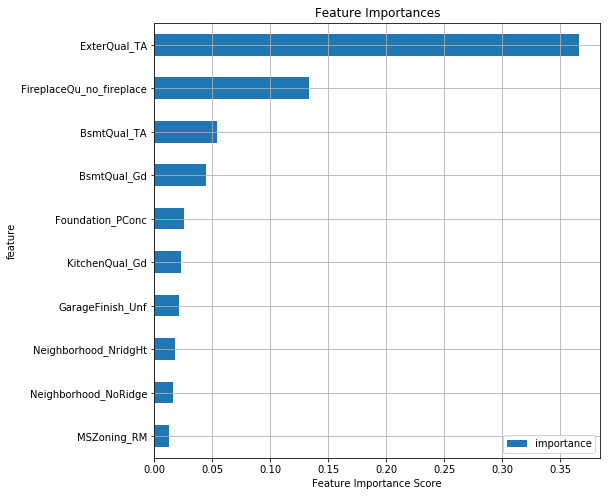

In [48]:
top_ten_features= plot_feature_importances(dt_regr, X1_train, y_train=None, 
                                           top_n=10, figsize=(8,8), print_table=False, 
                                           title="Feature Importances")

In [50]:
top_ten_features.sort_values(by=list(top_ten_features.columns),ascending=False)
top_features=top_ten_features.index.tolist()

In [51]:
top_features

['MSZoning_RM',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'GarageFinish_Unf',
 'KitchenQual_Gd',
 'Foundation_PConc',
 'BsmtQual_Gd',
 'BsmtQual_TA',
 'FireplaceQu_no_fireplace',
 'ExterQual_TA']

In [57]:
new_feat=['GarageArea', 'OpenPorchSF',
 'WoodDeckSF', 'EnclosedPorch',
 'TotalBsmtSF', '2ndFlrSF',
 'BsmtFinSF1', 'GrLivArea', 
 'MasVnrArea', '1stFlrSF', 
'LotFrontage','MSZoning_RM',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'GarageFinish_Unf',
 'KitchenQual_Gd',
 'Foundation_PConc',
 'BsmtQual_Gd',
 'BsmtQual_TA',
 'FireplaceQu_no_fireplace',
 'ExterQual_TA']

In [58]:
X2=dataset[new_feat]

In [59]:
from sklearn.model_selection import train_test_split
X2_train,X2_test,y_train,y_test=train_test_split(X2,y,test_size=0.2)

In [64]:
dt_regr2=DecisionTreeRegressor(criterion='mse', max_depth=7, max_features=20,
           max_leaf_nodes=None, min_impurity_decrease=0.2894736842105263,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [65]:
from sklearn.metrics import median_absolute_error

dt_regr2.fit(X2_train,y_train)

y_pred2=dt_regr2.predict(X2_test)

print(median_absolute_error(y_test,y_pred2))

14543.5


In [66]:
regressor_fitness_report(dt_regr2, X2, y, 10)

R square: 69.47%
The explained variance is: 71.11%
The median absolute error is: 15636.05
The root mean squared error is: 33571.87
The log mean squared error is: 0.04


In [ ]:
Keep=['GarageArea', 'YearBuilt','GrLivArea', 'GarageYrBlt','OpenPorchSF',
      'MasVnrArea','1stFlrSF', 'WoodDeckSF','TotalBsmtSF', 'EnclosedPorch']
X3=dataset[Keep]

In [ ]:
X3.head(10)

In [ ]:
X4 = pd.concat([X3,X2], axis=1, join='inner')

In [ ]:
dt_regr4=DecisionTreeRegressor(criterion='friedman_mse', max_depth=9, max_features=20,
           max_leaf_nodes=None, min_impurity_decrease=0.39473684210526316,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=0.046415888336127774,
           min_weight_fraction_leaf=0.002, presort=True, random_state=None,
           splitter='best')

In [ ]:
X4_train,X4_test,y_train,y_test=train_test_split(X4,y,test_size=0.2)

In [ ]:
dt_regr4.fit(X4_train,y_train)

y_pred4=dt_regr4.predict(X4_test)

print(median_absolute_error(y_test,y_pred4))

In [ ]:
regressor_fitness_report(dt_regr4, X4, y, 10)

In [ ]:
from sklearn import tree
import collections
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = tree.export_graphviz(dt_regr4,
                                feature_names=X4.columns,
                                out_file=None,
                                filled=True,
                                rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)
 
colors = ('turquoise', 'orange')
edges = collections.defaultdict(list)
 
for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))
for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])
Image(graph.create_png())